# Scalar Quantization: The Heart of Lossy Compression


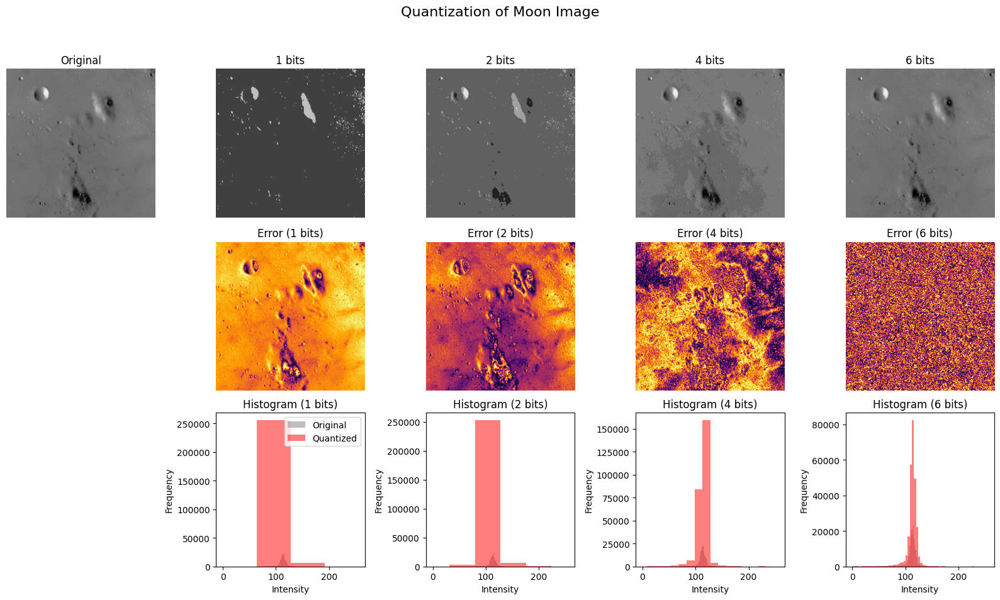

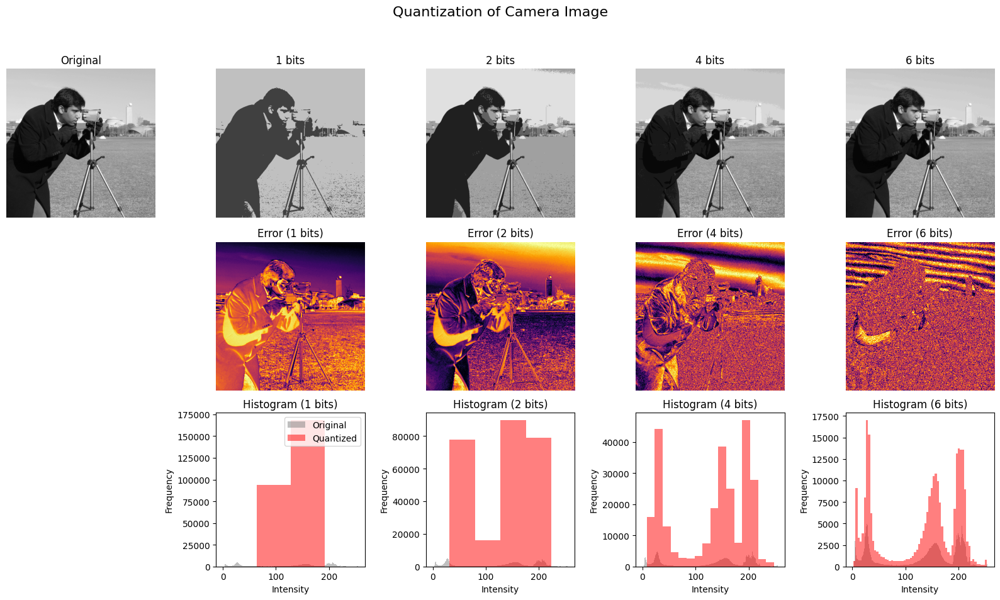

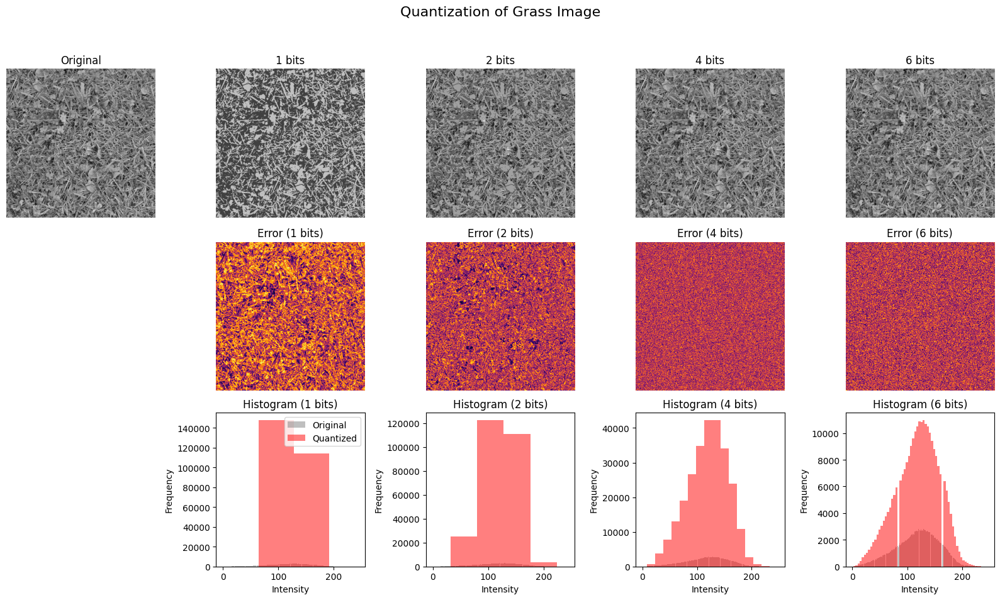

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, img_as_float


img1 = data.moon()   
img2 = data.camera()                      
img3 = data.grass()                       

images = [img1, img2, img3]
titles = ["Moon", "Camera", "Grass"]

# Implement a Uniform Scalar Quantizer: Write a Python function quantize(image,
# bits) that takes a grayscale image (with pixel values in the range [0, 255]) and the number
# of bits for quantization, and returns the quantized image. The function should reduce the
# number of intensity levels to 2bits

def quantize(image, bits):
    levels = 2 ** bits
    step_size = 256 / levels
    quantized_image = np.floor(image / step_size) * step_size + step_size / 2
    return quantized_image.astype(np.uint8)


# -------------------------
# Quantization experiments
# -------------------------
bit_depths = [1, 2, 4, 6]

for img, title in zip(images, titles):
    n_bits = len(bit_depths)
    n_cols = n_bits + 1  # +1 for the original image
    fig = plt.figure(figsize=(16, 10))
    plt.suptitle(f"Quantization of {title} Image", fontsize=16)

    # --- Row 1: Original + Quantized ---
    plt.subplot(3, n_cols, 1)
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    plt.title("Original")
    plt.axis('off')

    for i, bits in enumerate(bit_depths):
        levels = 2 ** bits
        quantized_img = quantize(img, bits)
        error_img = np.abs(img.astype(np.int16) - quantized_img.astype(np.int16))

        # --- Quantized image ---
        plt.subplot(3, n_cols, i + 2)
        plt.imshow(quantized_img, cmap='gray', vmin=0, vmax=255)
        plt.title(f"{bits} bits")
        plt.axis('off')

        # --- Error image ---
        plt.subplot(3, n_cols, n_cols + i + 2)
        plt.imshow(error_img, cmap='inferno')
        plt.title(f"Error ({bits} bits)")
        plt.axis('off')

        # --- Histogram ---
        plt.subplot(3, n_cols, 2 * n_cols + i + 2)
        plt.hist(img.ravel(), bins=256, color='gray', alpha=0.5, label='Original')
        plt.hist(quantized_img.ravel(), bins=levels, color='red', alpha=0.5, label='Quantized')
        plt.title(f"Histogram ({bits} bits)")
        plt.xlabel("Intensity")
        plt.ylabel("Frequency")
        if i == 0:
            plt.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

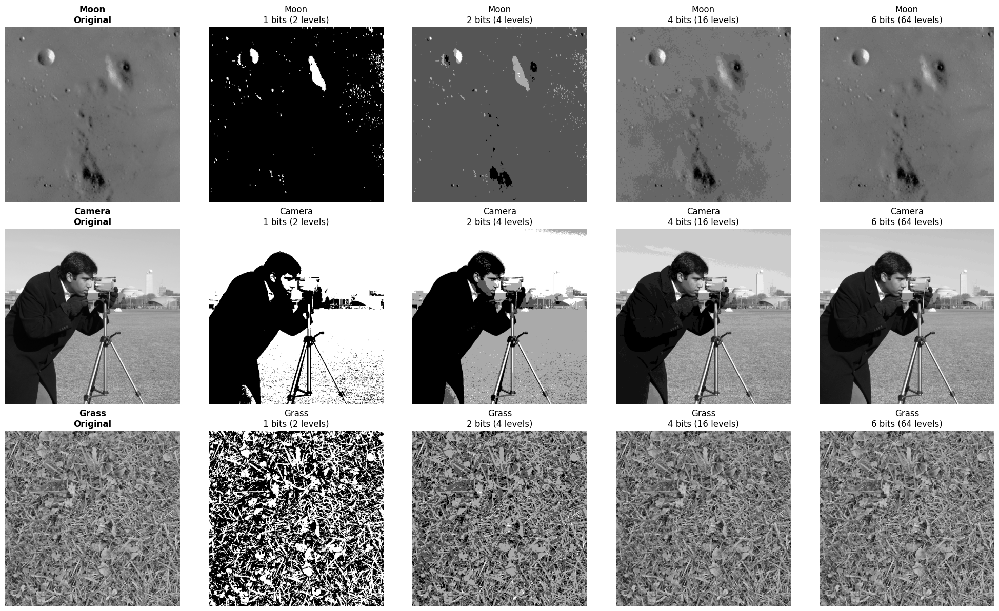


ANALYSIS FOR: Moon


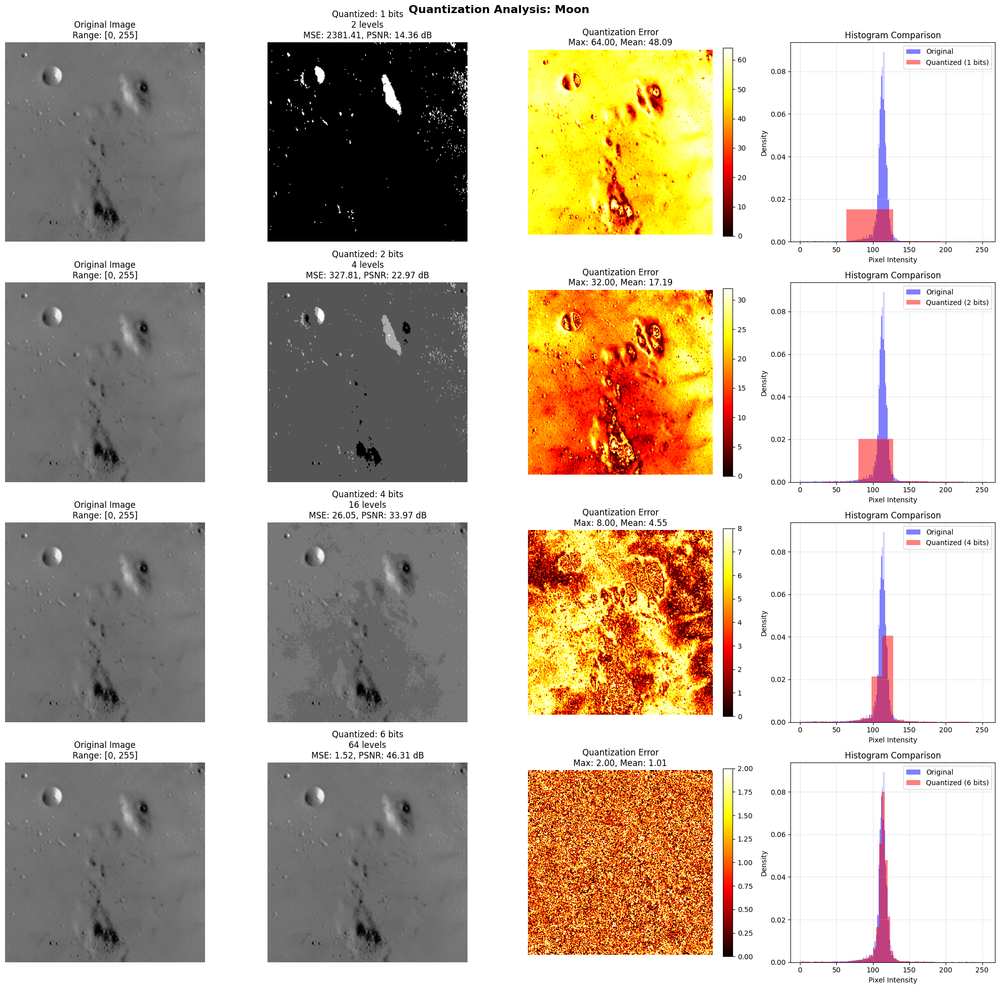


Summary for Moon:
Bits   Levels   MSE        PSNR (dB)    Max Error   
------------------------------------------------------------
1      2        2381.41    14.36        64.00       
2      4        327.81     22.97        32.00       
4      16       26.05      33.97        8.00        
6      64       1.52       46.31        2.00        

ANALYSIS FOR: Camera


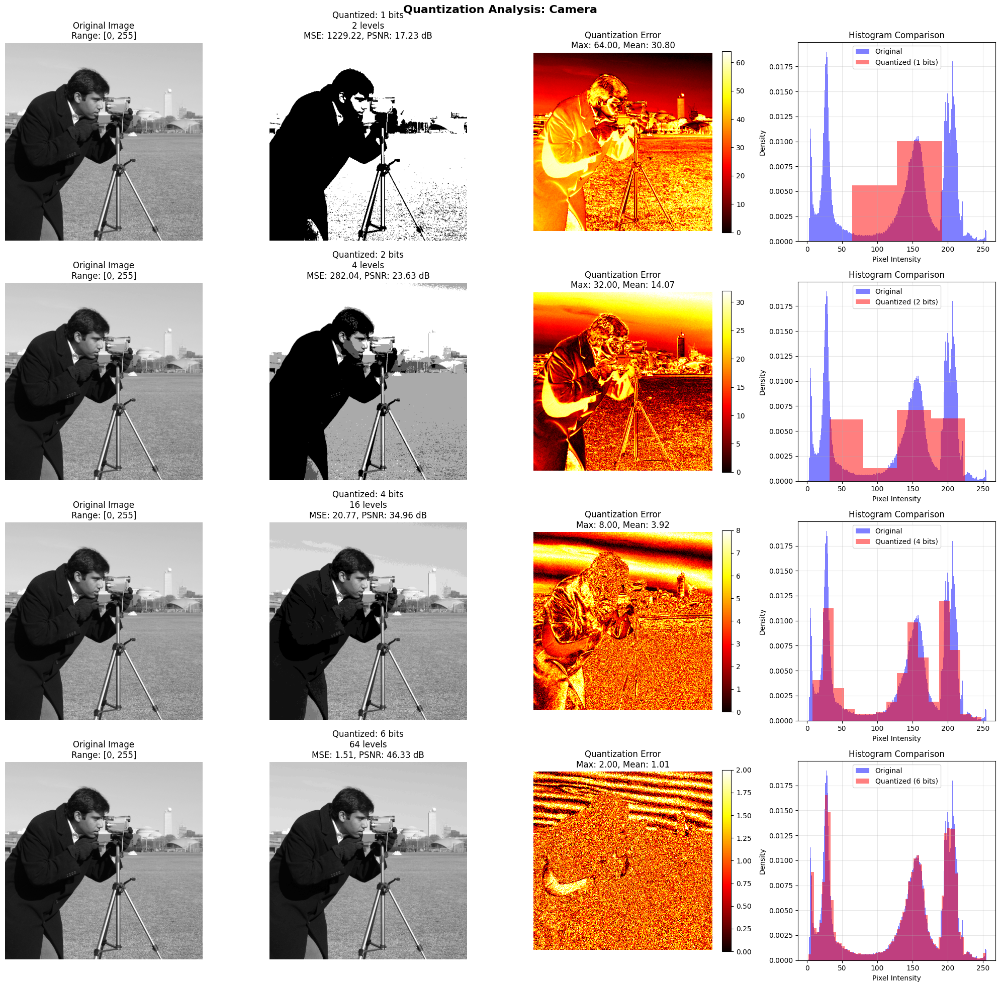


Summary for Camera:
Bits   Levels   MSE        PSNR (dB)    Max Error   
------------------------------------------------------------
1      2        1229.22    17.23        64.00       
2      4        282.04     23.63        32.00       
4      16       20.77      34.96        8.00        
6      64       1.51       46.33        2.00        

ANALYSIS FOR: Grass


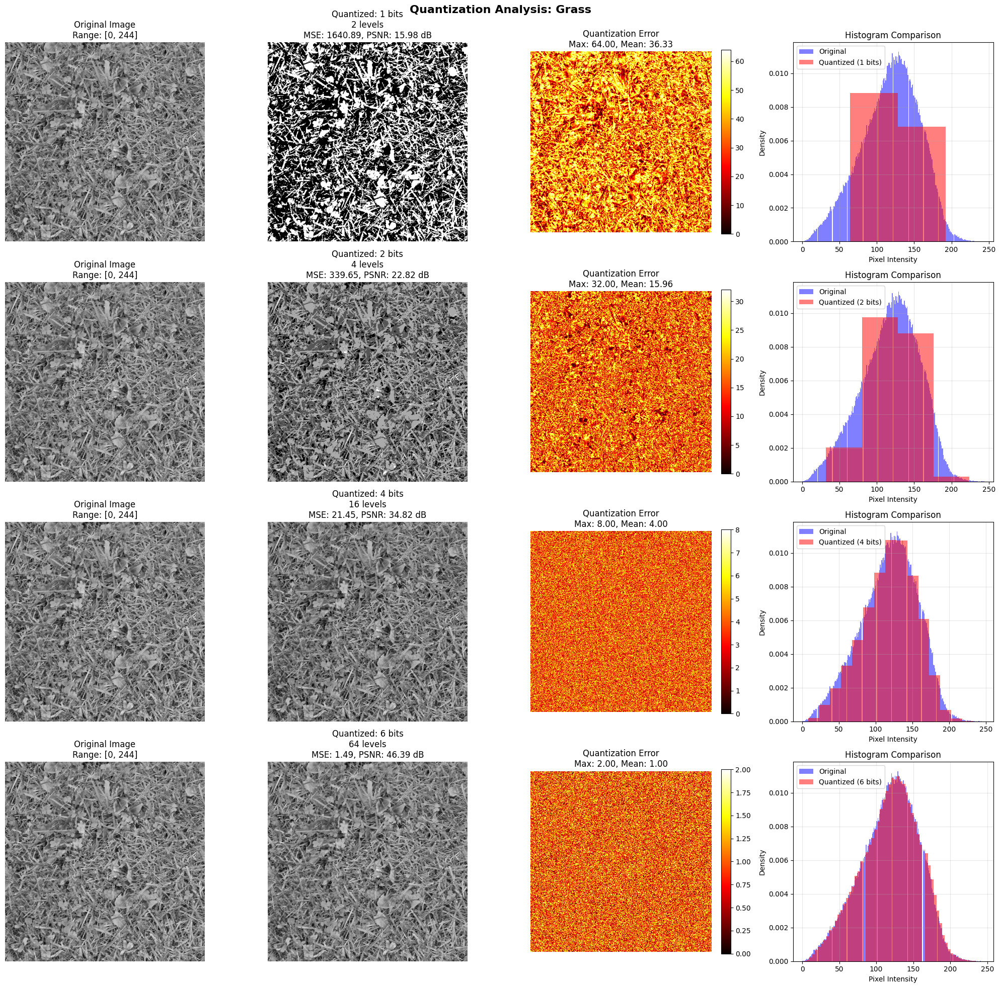


Summary for Grass:
Bits   Levels   MSE        PSNR (dB)    Max Error   
------------------------------------------------------------
1      2        1640.89    15.98        64.00       
2      4        339.65     22.82        32.00       
4      16       21.45      34.82        8.00        
6      64       1.49       46.39        2.00        

QUANTIZATION LEVELS VISUALIZATION


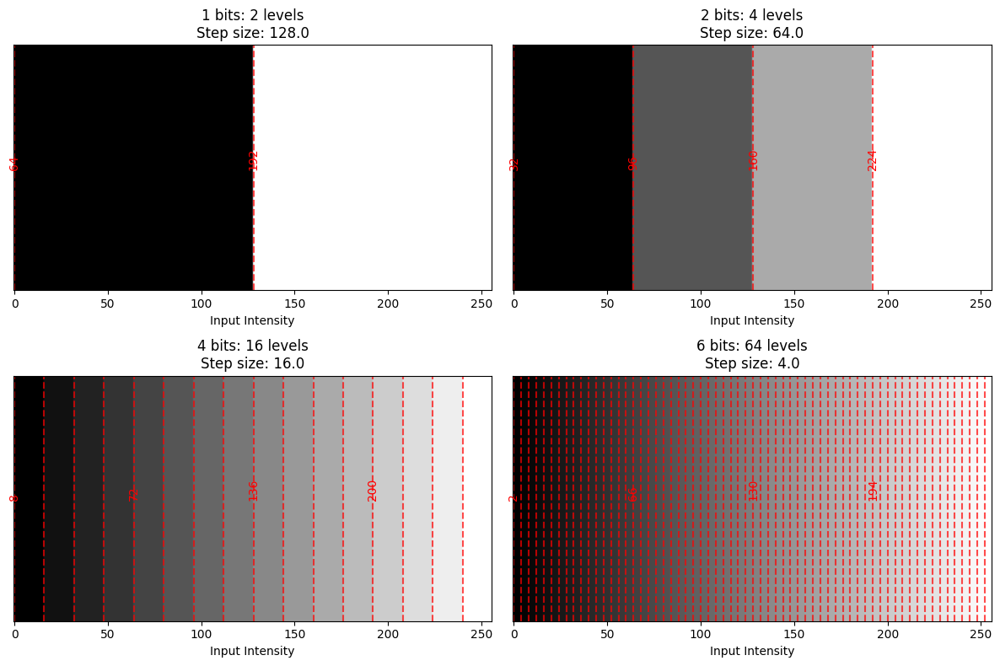

In [2]:
# Display the original and the quantized images.
# Compute and display the quantization error image (the absolute difference between the original and the quantized image).
# Plot the histograms of the original and the quantized images



# -------------------------
# Quantization experiments
# -------------------------
bit_depths = [1, 2, 4, 6]
# Create a comprehensive visualization
fig, axes = plt.subplots(len(images), len(bit_depths) + 1, 
                         figsize=(20, 12))

# Process each image
for i, (image, title) in enumerate(zip(images, titles)):
    # Ensure image is in correct format
    if image.dtype != np.uint8:
        image = image.astype(np.uint8)
    
    # Display original image in first column
    axes[i, 0].imshow(image, cmap='gray')
    axes[i, 0].set_title(f"{title}\nOriginal", fontweight='bold')
    axes[i, 0].axis('off')
    
    # Process each bit depth
    for j, bits in enumerate(bit_depths):
        col = j + 1
        
        # Quantize image
        quantized = quantize(image, bits)
        
        # Display quantized image
        axes[i, col].imshow(quantized, cmap='gray')
        axes[i, col].set_title(f"{title}\n{bits} bits ({2**bits} levels)")
        axes[i, col].axis('off')

plt.tight_layout()
plt.show()

# Create detailed analysis for each image and bit depth
for img_idx, (image, title) in enumerate(zip(images, titles)):
    print(f"\n{'='*60}")
    print(f"ANALYSIS FOR: {title}")
    print(f"{'='*60}")
    
    # Create figure for detailed analysis
    fig, axes = plt.subplots(len(bit_depths), 4, figsize=(20, 5*len(bit_depths)))
    fig.suptitle(f'Quantization Analysis: {title}', fontsize=16, fontweight='bold')
    
    if len(bit_depths) == 1:
        axes = [axes]  # Make it 2D for consistent indexing
    
    for row, bits in enumerate(bit_depths):
        # Quantize image
        quantized = quantize(image, bits)
        
        # Calculate quantization error
        error = np.abs(image.astype(float) - quantized.astype(float))
        
        # Calculate metrics
        mse = np.mean(error ** 2)
        psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
        
        # Plot original image
        axes[row, 0].imshow(image, cmap='gray')
        axes[row, 0].set_title(f'Original Image\nRange: [{image.min()}, {image.max()}]')
        axes[row, 0].axis('off')
        
        # Plot quantized image
        axes[row, 1].imshow(quantized, cmap='gray')
        axes[row, 1].set_title(f'Quantized: {bits} bits\n{2**bits} levels\nMSE: {mse:.2f}, PSNR: {psnr:.2f} dB')
        axes[row, 1].axis('off')
        
        # Plot error image
        im_error = axes[row, 2].imshow(error, cmap='hot')
        axes[row, 2].set_title(f'Quantization Error\nMax: {error.max():.2f}, Mean: {error.mean():.2f}')
        axes[row, 2].axis('off')
        plt.colorbar(im_error, ax=axes[row, 2], fraction=0.046)
        
        # Plot histograms
        axes[row, 3].hist(image.ravel(), bins=256, alpha=0.5, color='blue', 
                         label='Original', density=True)
        axes[row, 3].hist(quantized.ravel(), bins=2**bits, alpha=0.5, color='red', 
                         label=f'Quantized ({bits} bits)', density=True)
        axes[row, 3].set_title('Histogram Comparison')
        axes[row, 3].set_xlabel('Pixel Intensity')
        axes[row, 3].set_ylabel('Density')
        axes[row, 3].legend()
        axes[row, 3].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\nSummary for {title}:")
    print(f"{'Bits':<6} {'Levels':<8} {'MSE':<10} {'PSNR (dB)':<12} {'Max Error':<12}")
    print("-" * 60)
    for bits in bit_depths:
        quantized = quantize(image, bits)
        error = np.abs(image.astype(float) - quantized.astype(float))
        mse = np.mean(error ** 2)
        psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
        print(f"{bits:<6} {2**bits:<8} {mse:<10.2f} {psnr:<12.2f} {error.max():<12.2f}")

# Additional analysis: Visualize the quantization levels
print(f"\n{'='*60}")
print("QUANTIZATION LEVELS VISUALIZATION")
print(f"{'='*60}")

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.ravel()

for idx, bits in enumerate(bit_depths):
    levels = 2 ** bits
    step_size = 256 / levels
    
    # Create a ramp image to visualize quantization levels
    ramp = np.tile(np.arange(256), (50, 1))
    quantized_ramp = quantize(ramp, bits)
    
    axes[idx].imshow(quantized_ramp, cmap='gray', aspect='auto')
    axes[idx].set_title(f'{bits} bits: {levels} levels\nStep size: {step_size:.1f}')
    axes[idx].set_xlabel('Input Intensity')
    axes[idx].set_ylabel('')
    axes[idx].set_yticks([])
    
    # Add quantization level markers
    for level in range(levels):
        intensity = level * step_size + step_size / 2
        axes[idx].axvline(x=level * step_size, color='red', linestyle='--', alpha=0.7)
        if level % (max(1, levels//4)) == 0:  # Label some levels to avoid clutter
            axes[idx].text(level * step_size, 25, f'{intensity:.0f}', 
                          rotation=90, color='red', ha='center', va='bottom')

plt.tight_layout()
plt.show()


# Transform Coding and Quantization


Processed 4096 blocks
Each DCT block shape: (8, 8)
Total pixels/coefficients: 262144
--- Uniform Quantization ---

Quantization step Q=1:
  PSNR: 58.94 dB
  Est. Bits Per Pixel (bpp): 4.703
  Est. Compression Ratio: 1.70:1
  Est. Percentage Saved: 41.21%
  Number of unique values in first block: 5

Quantization step Q=5:
  PSNR: 46.55 dB
  Est. Bits Per Pixel (bpp): 2.598
  Est. Compression Ratio: 3.08:1
  Est. Percentage Saved: 67.52%
  Number of unique values in first block: 2

Quantization step Q=10:
  PSNR: 41.50 dB
  Est. Bits Per Pixel (bpp): 1.875
  Est. Compression Ratio: 4.27:1
  Est. Percentage Saved: 76.56%
  Number of unique values in first block: 2

Quantization step Q=20:
  PSNR: 36.38 dB
  Est. Bits Per Pixel (bpp): 1.235
  Est. Compression Ratio: 6.48:1
  Est. Percentage Saved: 84.56%
  Number of unique values in first block: 2

Quantization step Q=50:
  PSNR: 30.54 dB
  Est. Bits Per Pixel (bpp): 0.568
  Est. Compression Ratio: 14.09:1
  Est. Percentage Saved: 92.90%
 

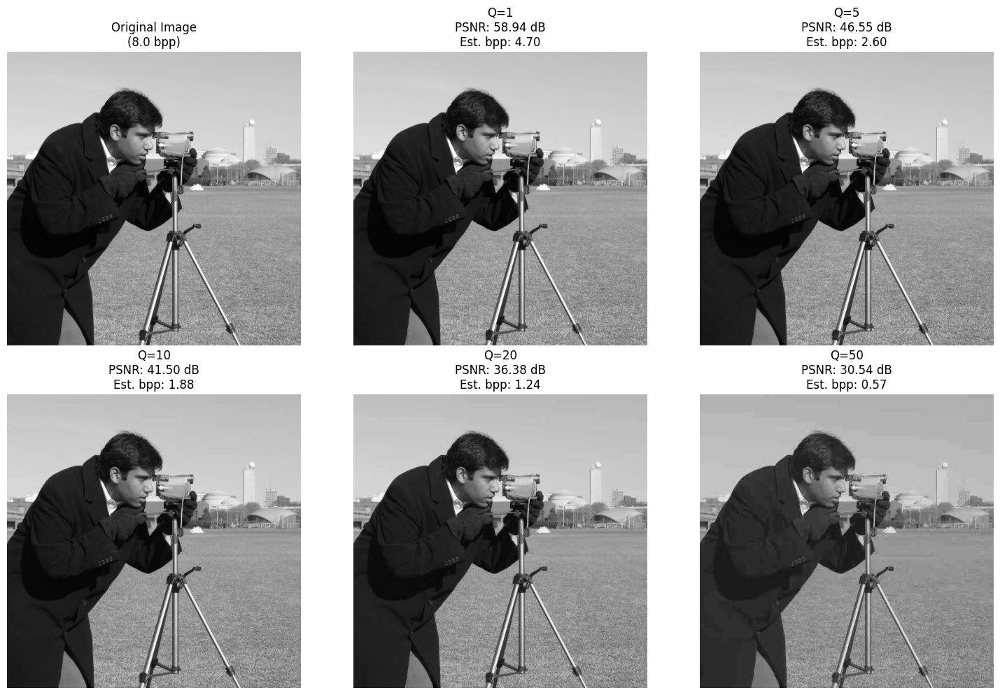


--- JPEG-style Quantization ---

Quality 10:
  PSNR = 28.36 dB
  Est. Bits Per Pixel (bpp): 0.367
  Est. Compression Ratio: 21.78:1
  Est. Percentage Saved: 95.41%

Quality 50:
  PSNR = 32.58 dB
  Est. Bits Per Pixel (bpp): 1.001
  Est. Compression Ratio: 7.99:1
  Est. Percentage Saved: 87.48%

Quality 90:
  PSNR = 40.39 dB
  Est. Bits Per Pixel (bpp): 2.292
  Est. Compression Ratio: 3.49:1
  Est. Percentage Saved: 71.35%


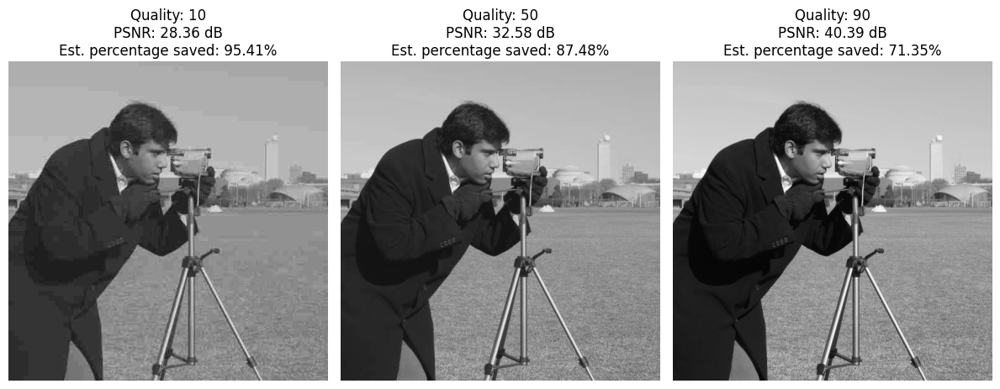

In [3]:
from scipy.fftpack import dct, idct
from skimage import data
import matplotlib.pyplot as plt
import numpy as np  # --- ADDED: numpy is needed for array operations
from scipy.stats import entropy  # --- ADDED: To calculate entropy for bpp

# Load image
img1 = data.camera()

# Get dimensions
h, w = img1.shape
block_size = 8

# Initialize list for DCT blocks
dct_blocks = []

# Process each 8x8 block
for i in range(0, h, block_size):
    for j in range(0, w, block_size):
        # Extract 8x8 block
        block = img1[i:i+block_size, j:j+block_size]
        
        # Compute 2D DCT
        # 
        dct_block = dct(dct(block.T, norm='ortho').T, norm='ortho')
        dct_blocks.append(dct_block)

print(f"Processed {len(dct_blocks)} blocks")
print(f"Each DCT block shape: {dct_blocks[0].shape}")
print(f"Total pixels/coefficients: {h * w}")

# --- (No changes to the functions below) ---

def uniform_quantizer(dct_coeffs, quantization_step):
    """
    Apply uniform quantization to DCT coefficients
    """
    quantized_blocks = []
    for block in dct_coeffs:
        # Element-wise division by quantization step and rounding
        quantized_block = np.round(block / quantization_step)
        quantized_blocks.append(quantized_block)
    
    return quantized_blocks

def inverse_quantizer(quantized_blocks, quantization_step):
    """
    Apply inverse quantization to recover DCT coefficients
    """
    recovered_blocks = []
    for block in quantized_blocks:
        # Element-wise multiplication by quantization step
        recovered_block = block * quantization_step
        recovered_blocks.append(recovered_block)
    
    return recovered_blocks

def reconstruct_image_from_dct(dct_blocks, h, w, block_size=8):
    """
    Reconstruct image from DCT blocks using inverse DCT
    """
    reconstructed = np.zeros((h, w))
    block_idx = 0
    
    for i in range(0, h, block_size):
        for j in range(0, w, block_size):
            # Compute inverse 2D DCT
            idct_block = idct(idct(dct_blocks[block_idx].T, norm='ortho').T, norm='ortho')
            # Place block in reconstructed image
            if i + block_size <= h and j + block_size <= w:
                reconstructed[i:i+block_size, j:j+block_size] = idct_block
            block_idx += 1
    
    return reconstructed

# --- (Changes to the plotting/printing loops below) ---

# Test different quantization steps
quantization_steps = [1, 5, 10, 20, 50]
original_bpp = 8.0  # Original image is 8 bits per pixel

plt.figure(figsize=(15, 10))

# Original image
plt.subplot(2, 3, 1)
plt.imshow(img1, cmap='gray')
plt.title(f'Original Image\n({original_bpp:.1f} bpp)')
plt.axis('off')

print("--- Uniform Quantization ---")
for idx, Q in enumerate(quantization_steps, 2):
    # Apply quantization
    quantized_blocks = uniform_quantizer(dct_blocks, Q)
    
    # Apply inverse quantization
    recovered_blocks = inverse_quantizer(quantized_blocks, Q)
    
    # Reconstruct image
    reconstructed_img = reconstruct_image_from_dct(recovered_blocks, h, w)
    
    # Calculate metrics
    mse = np.mean((img1 - reconstructed_img) ** 2)
    psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
    
    # --- ADDED: Compression Metrics ---
    # Flatten all coefficients into one list
    all_coeffs = np.concatenate([b.flatten() for b in quantized_blocks])
    # Get unique values and their counts
    _, counts = np.unique(all_coeffs, return_counts=True)
    # Calculate probabilities
    probabilities = counts / len(all_coeffs)
    # Calculate entropy (bits per pixel)
    bpp = entropy(probabilities, base=2)
    
    compression_ratio = original_bpp / bpp
    percentage_saved = (1 - (bpp / original_bpp)) * 100
    # --- End of Added Code ---

    # Display results
    plt.subplot(2, 3, idx)
    plt.imshow(reconstructed_img, cmap='gray')
    plt.title(f'Q={Q}\nPSNR: {psnr:.2f} dB\nEst. bpp: {bpp:.2f}')
    plt.axis('off')
    
    print(f"\nQuantization step Q={Q}:")
    print(f"  PSNR: {psnr:.2f} dB")
    print(f"  Est. Bits Per Pixel (bpp): {bpp:.3f}")
    print(f"  Est. Compression Ratio: {compression_ratio:.2f}:1")
    print(f"  Est. Percentage Saved: {percentage_saved:.2f}%")
    print(f"  Number of unique values in first block: {len(np.unique(quantized_blocks[0]))}")

plt.tight_layout()
plt.show()


# --- (No changes to the JPEG functions below) ---

def jpeg_style_quantization(dct_coeffs, quality=50):
    """
    JPEG-style quantization using a quality-dependent quantization matrix
    """
    # Standard JPEG luminance quantization matrix
    base_quant_matrix = np.array([
        [16, 11, 10, 16, 24, 40, 51, 61],
        [12, 12, 14, 19, 26, 58, 60, 55],
        [14, 13, 16, 24, 40, 57, 69, 56],
        [14, 17, 22, 29, 51, 87, 80, 62],
        [18, 22, 37, 56, 68, 109, 103, 77],
        [24, 35, 55, 64, 81, 104, 113, 92],
        [49, 64, 78, 87, 103, 121, 120, 101],
        [72, 92, 95, 98, 112, 100, 103, 99]
    ])
    
    # Adjust quantization matrix based on quality
    if quality <= 0: quality = 1
    if quality < 50:
        scale = 50 / quality
    else:
        scale = (100 - quality) / 50 if quality < 100 else 0.001 # Avoid div by zero if quality=100
        
    # Handle quality=100 (or near) case where scale is 0
    if scale == 0:
        quant_matrix = np.ones_like(base_quant_matrix)
    else:
        quant_matrix = np.clip(np.round(base_quant_matrix * scale), 1, 255)

    quantized_blocks = []
    for block in dct_coeffs:
        quantized_block = np.round(block / quant_matrix)
        quantized_blocks.append(quantized_block)
    
    return quantized_blocks, quant_matrix

def inverse_jpeg_quantization(quantized_blocks, quant_matrix):
    """
    Inverse JPEG-style quantization
    """
    recovered_blocks = []
    for block in quantized_blocks:
        recovered_block = block * quant_matrix
        recovered_blocks.append(recovered_block)
    
    return recovered_blocks

# --- (Changes to the plotting/printing loop below) ---

# Test JPEG-style quantization
print("\n--- JPEG-style Quantization ---")
qualities = [10, 50, 90]

plt.figure(figsize=(12, 5)) # Increased height a bit for title

for idx, quality in enumerate(qualities, 1):
    quantized_jpeg_blocks, q_matrix = jpeg_style_quantization(dct_blocks, quality)
    recovered_jpeg_blocks = inverse_jpeg_quantization(quantized_jpeg_blocks, q_matrix)
    reconstructed_jpeg_img = reconstruct_image_from_dct(recovered_jpeg_blocks, h, w)
    
    mse = np.mean((img1 - reconstructed_jpeg_img) ** 2)
    psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
    
    # --- ADDED: Compression Metrics ---
    all_coeffs_jpeg = np.concatenate([b.flatten() for b in quantized_jpeg_blocks])
    _, counts_jpeg = np.unique(all_coeffs_jpeg, return_counts=True)
    probabilities_jpeg = counts_jpeg / len(all_coeffs_jpeg)
    bpp_jpeg = entropy(probabilities_jpeg, base=2)
    
    compression_ratio_jpeg = original_bpp / bpp_jpeg
    percentage_saved_jpeg = (1 - (bpp_jpeg / original_bpp)) * 100
    # --- End of Added Code ---

    plt.subplot(1, 3, idx)
    plt.imshow(reconstructed_jpeg_img, cmap='gray')
    plt.title(f'Quality: {quality}\nPSNR: {psnr:.2f} dB\nEst. percentage saved: {percentage_saved_jpeg:.2f}%')
    plt.axis('off')
    
    print(f"\nQuality {quality}:")
    print(f"  PSNR = {psnr:.2f} dB")
    print(f"  Est. Bits Per Pixel (bpp): {bpp_jpeg:.3f}")
    print(f"  Est. Compression Ratio: {compression_ratio_jpeg:.2f}:1")
    print(f"  Est. Percentage Saved: {percentage_saved_jpeg:.2f}%")

plt.tight_layout()
plt.show()

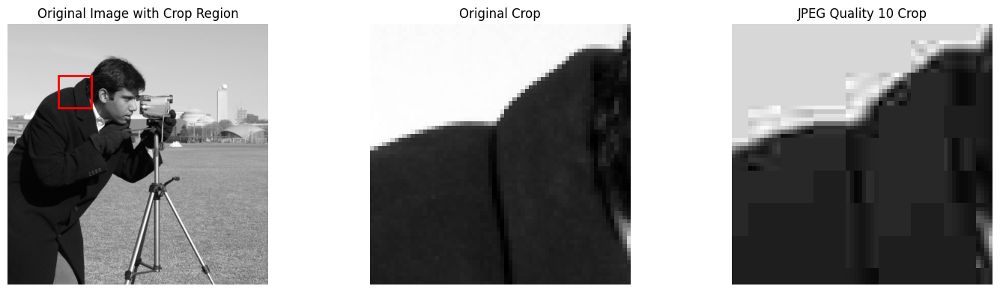


--- JPEG Quality 10 Crop Analysis ---
Crop position: top=100, left=100
Crop size: 64x64 pixels
Number of blocks in crop: 64

Quantization matrix for quality 10:
[[ 80.  55.  50.  80. 120. 200. 255. 255.]
 [ 60.  60.  70.  95. 130. 255. 255. 255.]
 [ 70.  65.  80. 120. 200. 255. 255. 255.]
 [ 70.  85. 110. 145. 255. 255. 255. 255.]
 [ 90. 110. 185. 255. 255. 255. 255. 255.]
 [120. 175. 255. 255. 255. 255. 255. 255.]
 [245. 255. 255. 255. 255. 255. 255. 255.]
 [255. 255. 255. 255. 255. 255. 255. 255.]]


In [4]:
# Display crop of JPEG quality 10 image

crop_top, crop_left = 100, 100  # Starting coordinates
crop_size = 64  # Size of the crop (64x64 pixels)

# Extract crop
crop_region = img1[crop_top:crop_top+crop_size, crop_left:crop_left+crop_size]

plt.figure(figsize=(15, 4))

# Original image with red box showing crop location
plt.subplot(1, 3, 1)
plt.imshow(img1, cmap='gray')
# Draw red rectangle around the crop area
rect = plt.Rectangle((crop_left, crop_top), crop_size, crop_size, 
                    fill=False, edgecolor='red', linewidth=2)
plt.gca().add_patch(rect)
plt.title('Original Image with Crop Region')
plt.axis('off')

# Original crop for comparison
plt.subplot(1, 3, 2)
plt.imshow(crop_region, cmap='gray')
plt.title('Original Crop')
plt.axis('off')

# JPEG Quality 10 crop
quantized_jpeg_blocks_10, q_matrix_10 = jpeg_style_quantization(dct_blocks, 10)
recovered_jpeg_blocks_10 = inverse_jpeg_quantization(quantized_jpeg_blocks_10, q_matrix_10)
reconstructed_jpeg_img_10 = reconstruct_image_from_dct(recovered_jpeg_blocks_10, h, w)

jpeg_10_crop = reconstructed_jpeg_img_10[crop_top:crop_top+crop_size, crop_left:crop_left+crop_size]

plt.subplot(1, 3, 3)
plt.imshow(jpeg_10_crop, cmap='gray')
plt.title('JPEG Quality 10 Crop')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print detailed analysis of the JPEG Q10 crop
print(f"\n--- JPEG Quality 10 Crop Analysis ---")
print(f"Crop position: top={crop_top}, left={crop_left}")
print(f"Crop size: {crop_size}x{crop_size} pixels")
print(f"Number of blocks in crop: {(crop_size//block_size) ** 2}")

# Show quantization matrix used for quality 10
print(f"\nQuantization matrix for quality 10:")
print(q_matrix_10)

# Rate-Distortion Optimization


Quality= 10 | SSIM=0.8901 | Rate=0.182 bpp
Quality= 10 | PSNR=35.23 dB | Rate=0.182 bpp
Quality= 30 | SSIM=0.9391 | Rate=0.322 bpp
Quality= 30 | PSNR=39.52 dB | Rate=0.322 bpp
Quality= 50 | SSIM=0.9558 | Rate=0.462 bpp
Quality= 50 | PSNR=41.15 dB | Rate=0.462 bpp
Quality= 70 | SSIM=0.9686 | Rate=0.669 bpp
Quality= 70 | PSNR=42.83 dB | Rate=0.669 bpp
Quality= 90 | SSIM=0.9859 | Rate=1.320 bpp
Quality= 90 | PSNR=46.89 dB | Rate=1.320 bpp


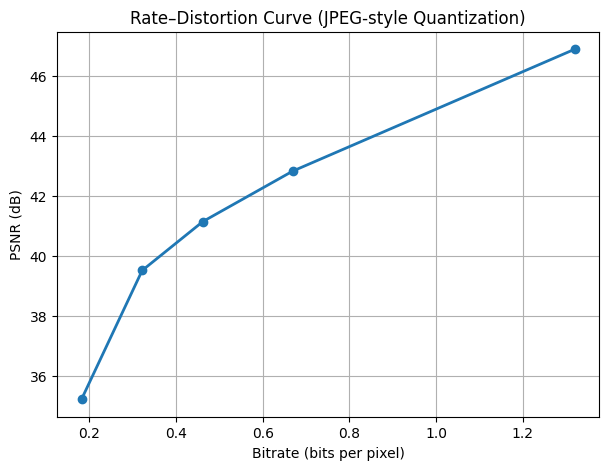

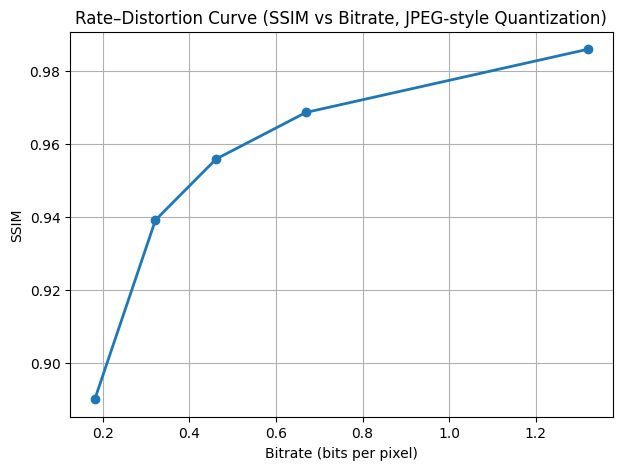

In [7]:

from skimage.metrics import structural_similarity as ssim

def estimate_bitrate(quantized_blocks, img_shape):
    """Estimate bitrate (bits per pixel) from entropy of quantized DCT coefficients."""
    # Flatten all coefficients into one array
    all_coeffs = np.concatenate([block.flatten() for block in quantized_blocks])
    
    # Compute histogram of quantized coefficients
    unique, counts = np.unique(all_coeffs, return_counts=True)
    probs = counts / counts.sum()
    
    # Entropy (in bits)
    H = -np.sum(probs * np.log2(probs + 1e-12))
    
    # Total number of coefficients
    num_coeffs = all_coeffs.size
    num_pixels = img_shape[0] * img_shape[1]
    
    # Rate in bits per pixel
    rate = H * (num_coeffs / num_pixels)
    return rate

# --- Main loop: Compute Rate–Distortion points ---

# Example: img1 is your grayscale image (values 0–255)
# dct_blocks, h, w = dct_blocks_from_image(img1)

# Load image
img1 = data.moon()

# Get dimensions
h, w = img1.shape
block_size = 8

# Initialize list for DCT blocks
dct_blocks = []

# Process each 8x8 block
for i in range(0, h, block_size):
    for j in range(0, w, block_size):
        # Extract 8x8 block
        block = img1[i:i+block_size, j:j+block_size]
        
        # Compute 2D DCT
        dct_block = dct(dct(block.T, norm='ortho').T, norm='ortho')
        dct_blocks.append(dct_block)


qualities = [10, 30, 50, 70, 90]
psnrs = []
ssims = []
bitrates = []

for q in qualities:
    quantized_blocks, q_matrix = jpeg_style_quantization(dct_blocks, q)
    recovered_blocks = inverse_jpeg_quantization(quantized_blocks, q_matrix)
    reconstructed_img = reconstruct_image_from_dct(recovered_blocks, h, w)
    
    mse = np.mean((img1 - reconstructed_img) ** 2)
    psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
    rate = estimate_bitrate(quantized_blocks, (h, w))
    
    psnrs.append(psnr)
    bitrates.append(rate)

    # Compute SSIM (0–1)
    ssim_val = ssim(img1, reconstructed_img, data_range=img1.max() - img1.min())
    rate = estimate_bitrate(quantized_blocks, (h, w))
    
    ssims.append(ssim_val)
    
    print(f"Quality={q:3d} | SSIM={ssim_val:.4f} | Rate={rate:.3f} bpp")
    
    print(f"Quality={q:3d} | PSNR={psnr:.2f} dB | Rate={rate:.3f} bpp")

# --- Plot R–D curve ---
plt.figure(figsize=(7,5))
plt.plot(bitrates, psnrs, 'o-', linewidth=2)
plt.xlabel("Bitrate (bits per pixel)")
plt.ylabel("PSNR (dB)")
plt.title("Rate–Distortion Curve (JPEG-style Quantization)")
plt.grid(True)
plt.show()


# --- Plot R–D curve (SSIM vs bitrate) ---
plt.figure(figsize=(7,5))
plt.plot(bitrates, ssims, 'o-', linewidth=2)
plt.xlabel("Bitrate (bits per pixel)")
plt.ylabel("SSIM")
plt.title("Rate–Distortion Curve (SSIM vs Bitrate, JPEG-style Quantization)")
plt.grid(True)
plt.show()

# PSNR vs SSIM

Processing '<class 'numpy.ndarray'>' image (512x512)...
Processed 4096 blocks.

--- Calculating R-D for JPEG-style Quantization ---
Quality |  PSNR (dB) |  SSIM (0-1) | Rate (bpp)
-------------------------------------------------
    1   |    24.17   |    0.6359   |   0.182
    5   |    26.24   |    0.6908   |   0.243
   10   |    28.40   |    0.7761   |   0.367
   20   |    30.24   |    0.8549   |   0.580
   30   |    31.24   |    0.8834   |   0.744
   40   |    31.96   |    0.9011   |   0.880
   50   |    32.58   |    0.9138   |   1.001
   60   |    33.25   |    0.9256   |   1.134
   70   |    34.30   |    0.9402   |   1.333
   80   |    36.12   |    0.9578   |   1.640
   90   |    40.16   |    0.9792   |   2.292
   99   |    50.98   |    0.9973   |   4.439

--- Plotting Results ---


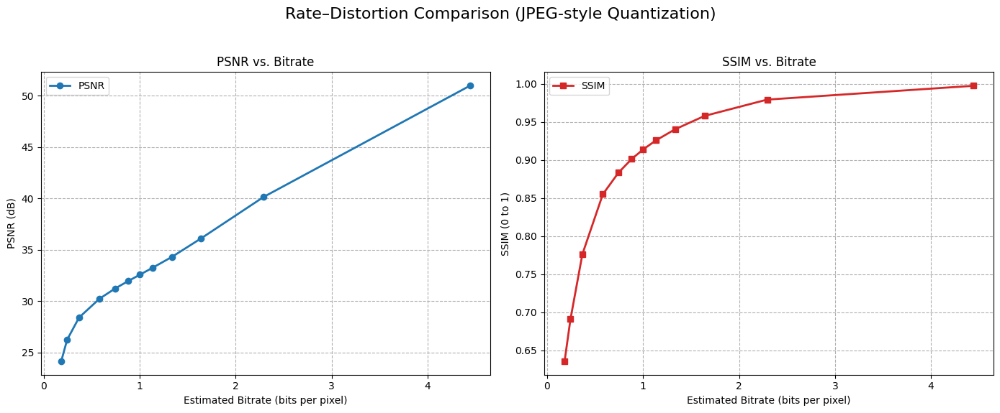


Saved R-D plots to 'rd_ssim_vs_psnr.png'


In [8]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fftpack import dct, idct
from skimage import data
from skimage.metrics import structural_similarity as ssim  # <-- Import SSIM
from skimage.metrics import peak_signal_noise_ratio as psnr # <-- Import PSNR for convenience

# ---
# --- All Helper Functions ---
# ---

def jpeg_style_quantization(dct_coeffs, quality=50):
    """
    JPEG-style quantization using a quality-dependent quantization matrix
    """
    base_quant_matrix = np.array([
        [16, 11, 10, 16, 24, 40, 51, 61],
        [12, 12, 14, 19, 26, 58, 60, 55],
        [14, 13, 16, 24, 40, 57, 69, 56],
        [14, 17, 22, 29, 51, 87, 80, 62],
        [18, 22, 37, 56, 68, 109, 103, 77],
        [24, 35, 55, 64, 81, 104, 113, 92],
        [49, 64, 78, 87, 103, 121, 120, 101],
        [72, 92, 95, 98, 112, 100, 103, 99]
    ])
    
    if quality <= 0: quality = 1
    if quality < 50:
        scale = 50 / quality
    else:
        scale = (100 - quality) / 50 if quality < 100 else 0.001
        
    if scale == 0:
        quant_matrix = np.ones_like(base_quant_matrix)
    else:
        quant_matrix = np.clip(np.round(base_quant_matrix * scale), 1, 255)

    quantized_blocks = []
    for block in dct_coeffs:
        quantized_block = np.round(block / quant_matrix)
        quantized_blocks.append(quantized_block)
    
    return quantized_blocks, quant_matrix

def inverse_jpeg_quantization(quantized_blocks, quant_matrix):
    """
    Inverse JPEG-style quantization
    """
    recovered_blocks = []
    for block in quantized_blocks:
        recovered_block = block * quant_matrix
        recovered_blocks.append(recovered_block)
    
    return recovered_blocks

def reconstruct_image_from_dct(dct_blocks, h, w, block_size=8):
    """
    Reconstruct image from DCT blocks using inverse DCT
    """
    reconstructed = np.zeros((h, w))
    block_idx = 0
    
    for i in range(0, h, block_size):
        for j in range(0, w, block_size):
            if block_idx < len(dct_blocks):
                idct_block = idct(idct(dct_blocks[block_idx].T, norm='ortho').T, norm='ortho')
                
                # Ensure we only place the block within the image boundaries
                row_end = min(i + block_size, h)
                col_end = min(j + block_size, w)
                
                row_slice = slice(i, row_end)
                col_slice = slice(j, col_end)
                
                block_row_slice = slice(0, row_end - i)
                block_col_slice = slice(0, col_end - j)
                
                reconstructed[row_slice, col_slice] = idct_block[block_row_slice, block_col_slice]
            
            block_idx += 1
    
    return reconstructed

def estimate_bitrate(quantized_blocks, img_shape):
    """Estimate bitrate (bits per pixel) from entropy of quantized DCT coefficients."""
    all_coeffs = np.concatenate([block.flatten() for block in quantized_blocks])
    unique, counts = np.unique(all_coeffs, return_counts=True)
    probs = counts / counts.sum()
    H = -np.sum(probs * np.log2(probs + 1e-12))
    
    num_coeffs = all_coeffs.size
    num_pixels = img_shape[0] * img_shape[1]
    
    # Adjust for padding if num_coeffs > num_pixels
    rate = H * (num_coeffs / num_pixels)
    return rate

# ---
# --- Main Processing ---
# ---

# Load image
img1 = data.camera()
# Ensure image is in 0-255 uint8 format
img1 = (img1 / img1.max() * 255).astype(np.uint8) 

# Get dimensions
h, w = img1.shape
block_size = 8

# --- 1. Get DCT blocks ---
dct_blocks = []
print(f"Processing '{type(img1)}' image ({h}x{w})...")
for i in range(0, h, block_size):
    for j in range(0, w, block_size):
        block = img1[i:i+block_size, j:j+block_size]
        
        # Pad blocks at the edges if image size is not multiple of block_size
        if block.shape[0] != block_size or block.shape[1] != block_size:
            padded_block = np.zeros((block_size, block_size))
            padded_block[:block.shape[0], :block.shape[1]] = block
            block = padded_block
            
        dct_block = dct(dct(block.T, norm='ortho').T, norm='ortho')
        dct_blocks.append(dct_block)
print(f"Processed {len(dct_blocks)} blocks.")

# --- 2. Calculate R-D for JPEG-style Quantization ---
print("\n--- Calculating R-D for JPEG-style Quantization ---")
print("Quality |  PSNR (dB) |  SSIM (0-1) | Rate (bpp)")
print("-------------------------------------------------")

qualities = [1, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 99]
psnrs_jpeg = []
ssims_jpeg = []
bitrates_jpeg = []

for q in qualities:
    quantized_blocks_jpeg, q_matrix = jpeg_style_quantization(dct_blocks, q)
    recovered_blocks_jpeg = inverse_jpeg_quantization(quantized_blocks_jpeg, q_matrix)
    reconstructed_img_jpeg = reconstruct_image_from_dct(recovered_blocks_jpeg, h, w)
    
    # Clip values to the valid 0-255 range before metric calculation
    reconstructed_img_jpeg = np.clip(reconstructed_img_jpeg, 0, 255).astype(np.uint8)
    
    # --- Calculate Metrics ---
    
    # 1. PSNR
    # data_range is 255 for an 8-bit image
    psnr_val = psnr(img1, reconstructed_img_jpeg, data_range=255)
    
    # 2. SSIM
    # data_range is 255 (max - min)
    ssim_val = ssim(img1, reconstructed_img_jpeg, data_range=255)
    
    # 3. Bitrate
    rate = estimate_bitrate(quantized_blocks_jpeg, (h, w))
    
    # --- Store and Print Results ---
    psnrs_jpeg.append(psnr_val)
    ssims_jpeg.append(ssim_val)
    bitrates_jpeg.append(rate)
    
    print(f"  {q:3d}   |   {psnr_val:6.2f}   |   {ssim_val:7.4f}   |  {rate:6.3f}")


# --- 3. Plot Combined R-D Curve ---
print("\n--- Plotting Results ---")

# Create a figure with two subplots (side-by-side)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot 1: PSNR vs. Bitrate
ax1.plot(bitrates_jpeg, psnrs_jpeg, 'o-', linewidth=2, label='PSNR')
ax1.set_xlabel("Estimated Bitrate (bits per pixel)")
ax1.set_ylabel("PSNR (dB)")
ax1.set_title("PSNR vs. Bitrate")
ax1.legend()
ax1.grid(True, which="both", linestyle='--')

# Plot 2: SSIM vs. Bitrate
ax2.plot(bitrates_jpeg, ssims_jpeg, 's-', color='tab:red', linewidth=2, label='SSIM')
ax2.set_xlabel("Estimated Bitrate (bits per pixel)")
ax2.set_ylabel("SSIM (0 to 1)")
ax2.set_title("SSIM vs. Bitrate")
ax2.legend()
ax2.grid(True, which="both", linestyle='--')

fig.suptitle("Rate–Distortion Comparison (JPEG-style Quantization)", fontsize=16)
fig.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
plt.savefig("rd_ssim_vs_psnr.png")
plt.show()

print("\nSaved R-D plots to 'rd_ssim_vs_psnr.png'")

 # Putting It All Together: A Simplified JPEG-like Codec

In [16]:
import numpy as np
from scipy.fftpack import dct, idct
from skimage import data
from collections import Counter
import heapq

# ---------------------------
# Step 1: Quantization
# ---------------------------
def jpeg_style_quantization(dct_coeffs, quality=50):
    base_quant_matrix = np.array([
        [16, 11, 10, 16, 24, 40, 51, 61],
        [12, 12, 14, 19, 26, 58, 60, 55],
        [14, 13, 16, 24, 40, 57, 69, 56],
        [14, 17, 22, 29, 51, 87, 80, 62],
        [18, 22, 37, 56, 68, 109, 103, 77],
        [24, 35, 55, 64, 81, 104, 113, 92],
        [49, 64, 78, 87, 103, 121, 120, 101],
        [72, 92, 95, 98, 112, 100, 103, 99]
    ])
    
    if quality < 50:
        scale = 50 / quality
    else:
        scale = (100 - quality) / 50
    
    quant_matrix = np.clip(np.round(base_quant_matrix * scale), 1, 255)
    
    quantized_blocks = [np.round(block / quant_matrix) for block in dct_coeffs]
    
    return quantized_blocks, quant_matrix


# ---------------------------
# Step 2: Zigzag scanning
# ---------------------------
def zigzag(block):
    indices = [
        (0,0),(0,1),(1,0),(2,0),(1,1),(0,2),(0,3),(1,2),
        (2,1),(3,0),(4,0),(3,1),(2,2),(1,3),(0,4),(0,5),
        (1,4),(2,3),(3,2),(4,1),(5,0),(6,0),(5,1),(4,2),
        (3,3),(2,4),(1,5),(0,6),(0,7),(1,6),(2,5),(3,4),
        (4,3),(5,2),(6,1),(7,0),(7,1),(6,2),(5,3),(4,4),
        (3,5),(2,6),(1,7),(2,7),(3,6),(4,5),(5,4),(6,3),
        (7,2),(7,3),(6,4),(5,5),(4,6),(3,7),(4,7),(5,6),
        (6,5),(7,4),(7,5),(6,6),(5,7),(6,7),(7,6),(7,7)
    ]
    return np.array([block[i, j] for i, j in indices])

# ---------------------------
# Step 3: Run-Length Encoding
# ---------------------------
def run_length_encode(arr):
    result = []
    zeros = 0
    for v in arr[1:]:  # skip DC coefficient
        if v == 0:
            zeros += 1
        else:
            result.append((zeros, v))
            zeros = 0
    result.append((0, 0))  # End of Block marker
    return result

# ---------------------------
# Step 4: Huffman Coding
# ---------------------------
class HuffmanNode:
    def __init__(self, symbol, freq):
        self.symbol = symbol
        self.freq = freq
        self.left = None
        self.right = None

    def __lt__(self, other):
        return self.freq < other.freq

def build_huffman_tree(symbols):
    heap = [HuffmanNode(sym, freq) for sym, freq in Counter(symbols).items()]
    heapq.heapify(heap)

    while len(heap) > 1:
        n1 = heapq.heappop(heap)
        n2 = heapq.heappop(heap)
        merged = HuffmanNode(None, n1.freq + n2.freq)
        merged.left = n1
        merged.right = n2
        heapq.heappush(heap, merged)

    return heap[0]

def build_huffman_codes(node, prefix="", codebook=None):
    if codebook is None:
        codebook = {}
    if node.symbol is not None:
        codebook[node.symbol] = prefix
    else:
        build_huffman_codes(node.left, prefix + "0", codebook)
        build_huffman_codes(node.right, prefix + "1", codebook)
    return codebook

# ---------------------------
# Step 5: Encode Image
# ---------------------------
img = data.moon()
h, w = img.shape
block_size = 8
q = 30

# Compute DCT blocks
dct_blocks = []
for i in range(0, h, block_size):
    for j in range(0, w, block_size):
        block = img[i:i+block_size, j:j+block_size]
        if block.shape != (8, 8):
            continue  # skip partial blocks
        dct_block = dct(dct(block.T, norm='ortho').T, norm='ortho')
        dct_blocks.append(dct_block)

# Quantize
quantized_blocks, q_matrix = jpeg_style_quantization(dct_blocks, q)

rle_symbols = []
prev_dc = 0

for qb in quantized_blocks:
    zz = zigzag(qb)
    dc = zz[0]
    dc_diff = int(dc - prev_dc)   # store delta for DC term
    prev_dc = dc

    rle_symbols.append(("DC", dc_diff))  # tag DC values

    # Encode ACs with run-length
    ac_rle = run_length_encode(zz)
    for pair in ac_rle:
        rle_symbols.append(pair)

# Flatten and encode as strings for Huffman
symbols = [str(p) for p in rle_symbols]
tree = build_huffman_tree(symbols)
codes = build_huffman_codes(tree)
bitstream = ''.join(codes[sym] for sym in symbols)

print(f"Compressed bitstream length: {len(bitstream)} bits")
print(f"Unique Huffman codes: {len(codes)}")

# Original image bitstream length (8 bits per pixel)
original_bits = h * w * 8

compressed_bits = len(bitstream)

compression_percentage = 100 * (original_bits - compressed_bits) / original_bits

print(f"Original image bitstream length: {original_bits} bits")
print(f"Compressed bitstream length: {compressed_bits} bits")
print(f"Percentage saved: {compression_percentage:.2f}%")


Compressed bitstream length: 47064 bits
Unique Huffman codes: 124
Original image bitstream length: 2097152 bits
Compressed bitstream length: 47064 bits
Percentage saved: 97.76%


PSNR: 39.54 dB


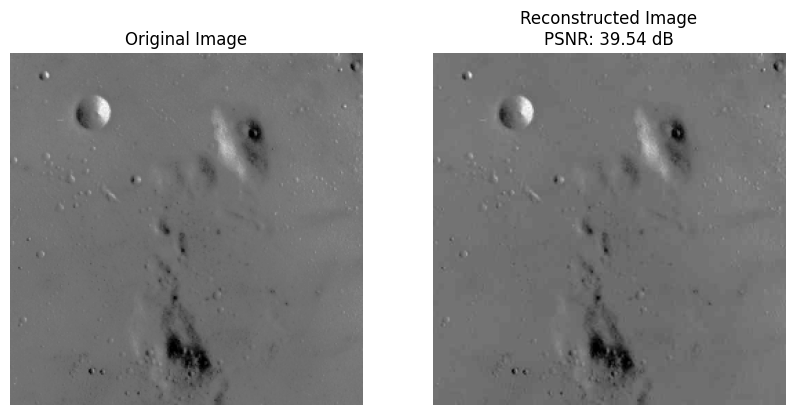

In [23]:
# ---------------------------
# Step 6: Decoder
# ---------------------------

def huffman_decode(bitstream, tree):
    """Decode a bitstream using the provided Huffman tree."""
    decoded_symbols = []
    node = tree
    for bit in bitstream:
        node = node.left if bit == '0' else node.right
        if node.symbol is not None:
            decoded_symbols.append(node.symbol)
            node = tree
    return decoded_symbols


def run_length_decode(rle_list):
    """Reconstruct zigzagged DCT block from run-length encoded pairs."""
    zz = [0] * 64
    zz[0] = 0  # DC left as 0 since we didn’t encode it separately here
    k = 1
    for run, val in rle_list:
        if (run, val) == (0, 0):  # End of Block
            break
        k += run
        if k < 64:
            zz[k] = val
            k += 1
    return np.array(zz)


def inverse_zigzag(arr):
    """Inverse zigzag scanning to reconstruct 8x8 block."""
    indices = [
        (0,0),(0,1),(1,0),(2,0),(1,1),(0,2),(0,3),(1,2),
        (2,1),(3,0),(4,0),(3,1),(2,2),(1,3),(0,4),(0,5),
        (1,4),(2,3),(3,2),(4,1),(5,0),(6,0),(5,1),(4,2),
        (3,3),(2,4),(1,5),(0,6),(0,7),(1,6),(2,5),(3,4),
        (4,3),(5,2),(6,1),(7,0),(7,1),(6,2),(5,3),(4,4),
        (3,5),(2,6),(1,7),(2,7),(3,6),(4,5),(5,4),(6,3),
        (7,2),(7,3),(6,4),(5,5),(4,6),(3,7),(4,7),(5,6),
        (6,5),(7,4),(7,5),(6,6),(5,7),(6,7),(7,6),(7,7)
    ]
    block = np.zeros((8, 8))
    for idx, (i, j) in enumerate(indices):
        block[i, j] = arr[idx]
    return block


# ---------------------------
# Huffman Decoding
# ---------------------------
decoded_symbols = huffman_decode(bitstream, tree)
decoded_tuples = [eval(s) for s in decoded_symbols]

decoded_blocks = []
i = 0
prev_dc = 0

while i < len(decoded_tuples):
    # 1️⃣ First symbol is DC
    if decoded_tuples[i][0] != "DC":
        raise ValueError("Expected DC symbol at start of block")
    dc_diff = decoded_tuples[i][1]
    dc_val = prev_dc + dc_diff
    prev_dc = dc_val
    i += 1

    # 2️⃣ Then AC pairs until (0,0)
    block_rle = []
    while i < len(decoded_tuples):
        pair = decoded_tuples[i]
        i += 1
        if pair == (0, 0):
            break
        block_rle.append(pair)

    # 3️⃣ Build full zigzag array
    zz = [0] * 64
    zz[0] = dc_val
    k = 1
    for run, val in block_rle:
        k += run
        if k < 64:
            zz[k] = val
            k += 1

    # 4️⃣ Inverse zigzag
    block = inverse_zigzag(zz)
    decoded_blocks.append(block)

# ---------------------------
# Dequantize and Inverse DCT
# ---------------------------
reconstructed_blocks = []
for qb in decoded_blocks:
    dequant = qb * q_matrix
    block = idct(idct(dequant.T, norm='ortho').T, norm='ortho')
    reconstructed_blocks.append(block)

# ---------------------------
# Reconstruct Image
# ---------------------------
recon_img = np.zeros((h, w))
idx = 0
for i in range(0, h, block_size):
    for j in range(0, w, block_size):
        if i + block_size <= h and j + block_size <= w:
            recon_img[i:i+block_size, j:j+block_size] = reconstructed_blocks[idx]
            idx += 1

# Clip values
recon_img = np.clip(recon_img, 0, 255)

# ---------------------------
# Display Results
# ---------------------------
import matplotlib.pyplot as plt
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title("Original Image")
plt.axis('off')


# ---------------------------
# Compute PSNR
# ---------------------------
mse = np.mean((img - recon_img) ** 2)
psnr = 10 * np.log10(255**2 / mse)
print(f"PSNR: {psnr:.2f} dB")


plt.subplot(1,2,2)
plt.imshow(recon_img, cmap='gray')

# add psnr
plt.title(f"Reconstructed Image\nPSNR: {psnr:.2f} dB")
plt.axis('off')

plt.show()


